In [ ]:
!pip install dill

In [8]:
#backup_dir = 'drive/MyDrive/STAT 483/Data/Task 1/gas-sensor-array-temperature-modulation'
backup_dir = 'gas-sensor-array-temperature-modulation'
backup_file = '20160930_203718.csv'
backup_path = backup_dir + '/' + backup_file

In [ ]:
import os
import dill
from google.colab import drive



def init_drive():
  # create directory if not exist
  drive.mount('drive')
  if not os.path.exists(backup_dir):
    !mkdir backup_dir

def restart_kernel():
  os._exit(00)

def save_session():
  init_drive()
  dill.dump_session(backup_path)

def load_session():
  init_drive()
  dill.load_session(backup_path)

In [3]:
restart_kernel()
load_session()

NameError: ignored

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [5]:
import keras
from keras.datasets import cifar10
from keras.models import Sequential
from keras import datasets, layers, models
from keras.utils import to_categorical
from keras import regularizers
from keras.layers import Dense, Dropout, BatchNormalization, Conv1D, MaxPool1D, MaxPooling1D, Flatten

In [2]:
def import_data(data_source, col_names=None):
    return pd.read_csv(data_source, names=col_names)

In [10]:
from pandas import concat

In [11]:
def merge_datasets(filenames, columns = None):
  file0 = filenames.pop(0)
  dfs = []
  merged_df = import_data(file0)
  dfs.append(merged_df)
  # print(file0)
  for file in filenames:
    print(file)
    curr_df = import_data(file)
    curr_df.info()
    # merged_df.concat(curr_df)
    dfs.append(curr_df)
  merged_dfs = concat(dfs, axis = 0)
  return merged_dfs

In [12]:
merged_train_df = merge_datasets([backup_dir + "/20160930_203718.csv",
                                  backup_dir + "/20161001_231809.csv",
                                  backup_dir + "/20161003_085624.csv",
                                  backup_dir + "/20161004_104124.csv",
                                  backup_dir + "/20161005_140846.csv",
                                  backup_dir + "/20161006_182224.csv",
                                  backup_dir + "/20161007_210049.csv",
                                  backup_dir + "/20161008_234508.csv",
                                  backup_dir + "/20161010_095046.csv",
                                  backup_dir + "/20161011_113032.csv"])

gas-sensor-array-temperature-modulation/20161001_231809.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 295516 entries, 0 to 295515
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Time (s)            295516 non-null  float64
 1   CO (ppm)            295516 non-null  float64
 2   Humidity (%r.h.)    295516 non-null  float64
 3   Temperature (C)     295516 non-null  float64
 4   Flow rate (mL/min)  295516 non-null  float64
 5   Heater voltage (V)  295516 non-null  float64
 6   R1 (MOhm)           295516 non-null  float64
 7   R2 (MOhm)           295516 non-null  float64
 8   R3 (MOhm)           295516 non-null  float64
 9   R4 (MOhm)           295516 non-null  float64
 10  R5 (MOhm)           295516 non-null  float64
 11  R6 (MOhm)           295516 non-null  float64
 12  R7 (MOhm)           295516 non-null  float64
 13  R8 (MOhm)           295516 non-null  float64
 14  R9 (MOhm)           2955

In [19]:
merged_train_df.reset_index(drop=True, inplace=True)

In [20]:
merged_train_df.to_csv("merged_train_data.csv")

In [17]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2955983 entries, 0 to 295390
Data columns (total 20 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Time (s)            float64
 1   CO (ppm)            float64
 2   Humidity (%r.h.)    float64
 3   Temperature (C)     float64
 4   Flow rate (mL/min)  float64
 5   Heater voltage (V)  float64
 6   R1 (MOhm)           float64
 7   R2 (MOhm)           float64
 8   R3 (MOhm)           float64
 9   R4 (MOhm)           float64
 10  R5 (MOhm)           float64
 11  R6 (MOhm)           float64
 12  R7 (MOhm)           float64
 13  R8 (MOhm)           float64
 14  R9 (MOhm)           float64
 15  R10 (MOhm)          float64
 16  R11 (MOhm)          float64
 17  R12 (MOhm)          float64
 18  R13 (MOhm)          float64
 19  R14 (MOhm)          float64
dtypes: float64(20)
memory usage: 473.6 MB


In [21]:
merged_test_df = merge_datasets([backup_dir + "/20161013_143355.csv",
                                  backup_dir + "/20161014_184659.csv",
                                  backup_dir + "/20161016_053656.csv"])

gas-sensor-array-temperature-modulation/20161014_184659.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 295881 entries, 0 to 295880
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Time (s)            295881 non-null  float64
 1   CO (ppm)            295881 non-null  float64
 2   Humidity (%r.h.)    295881 non-null  float64
 3   Temperature (C)     295881 non-null  float64
 4   Flow rate (mL/min)  295881 non-null  float64
 5   Heater voltage (V)  295881 non-null  float64
 6   R1 (MOhm)           295881 non-null  float64
 7   R2 (MOhm)           295881 non-null  float64
 8   R3 (MOhm)           295881 non-null  float64
 9   R4 (MOhm)           295881 non-null  float64
 10  R5 (MOhm)           295881 non-null  float64
 11  R6 (MOhm)           295881 non-null  float64
 12  R7 (MOhm)           295881 non-null  float64
 13  R8 (MOhm)           295881 non-null  float64
 14  R9 (MOhm)           2958

In [22]:
merged_test_df.reset_index(drop=True, inplace=True)

In [ ]:
merged_test_df.to_csv("merged_test_data.csv")

In [7]:
#read the file of first measurement (performed at 2016-09-30) as a data frame:
df20160930 = import_data(backup_path)
col_names = df20160930.columns.values

In [10]:
#show the head of the data frame:
df20160930.head(20)

,Time (s),CO (ppm),Humidity (%r.h.),Temperature (C),Flow rate (mL/min),Heater voltage (V),R1 (MOhm),R2 (MOhm),R3 (MOhm),R4 (MOhm),R5 (MOhm),R6 (MOhm),R7 (MOhm),R8 (MOhm),R9 (MOhm),R10 (MOhm),R11 (MOhm),R12 (MOhm),R13 (MOhm),R14 (MOhm)
0,0.000,0.0,49.7534,23.7184,233.2737,0.8993,0.2231,0.6365,1.1493,0.8483,1.2534,1.4449,1.9906,1.3303,1.4480,1.9148,3.4651,5.2144,6.5806,8.6385
1,0.309,0.0,55.8400,26.6200,241.6323,0.2112,2.1314,5.3552,9.7569,6.3188,9.4472,10.5769,13.6317,21.9829,16.1902,24.2780,31.1014,34.7193,31.7505,41.9167
2,0.618,0.0,55.8400,26.6200,241.3888,0.2070,10.5318,22.5612,37.2635,17.7848,33.0704,36.3160,42.5746,49.7495,31.7533,57.7289,53.6275,56.9212,47.8255,62.9436
3,0.926,0.0,55.8400,26.6200,241.1461,0.2042,29.5749,49.5111,65.6318,26.1447,58.3847,67.5130,68.0064,59.2824,36.7821,66.0832,66.8349,66.9695,50.3730,64.8363
4,1.234,0.0,55.8400,26.6200,240.9121,0.2030,49.5111,67.0368,77.8317,27.9625,71.7732,79.9474,79.8631,62.5385,39.6271,68.1441,62.0947,49.4614,52.8453,66.8445
5,1.544,0.0,55.8400,26.6200,240.8361,0.2020,60.1083,74.3444,81.5100,29.7970,72.9643,83.1477,80.5302,58.0412,39.2482,65.0981,67.8697,63.5316,50.3730,63.3641
6,1.854,0.0,55.8400,26.6200,240.7602,0.2010,64.1020,74.3444,76.4748,28.1797,72.4181,78.4368,79.0768,59.7614,40.4067,64.1416,61.6173,60.5007,50.6424,66.2847
7,2.163,0.0,55.8400,26.6200,240.6845,0.2009,62.6869,71.3877,73.8965,27.6523,64.4007,69.7912,72.5239,55.6363,39.6271,62.7987,65.8307,56.5195,50.3730,64.3090
8,2.472,0.0,55.8400,26.6200,240.6624,0.2009,54.8336,67.0368,69.2228,27.4429,64.9211,63.9055,63.5872,54.0730,40.5881,64.1416,63.9090,53.0811,48.9146,63.3641
9,2.781,0.0,55.8400,26.6200,240.6519,0.2003,51.2600,64.5303,61.4312,25.6881,54.7235,57.2118,59.6255,55.6363,40.9928,61.9071,60.3791,52.7888,48.3640,62.4461


In [11]:
#show the details of the data frame
#(number and list of the columns names,data type of each column,...)
df20160930.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 295719 entries, 0 to 295718
Data columns (total 20 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Time (s)            295719 non-null  float64
 1   CO (ppm)            295719 non-null  float64
 2   Humidity (%r.h.)    295719 non-null  float64
 3   Temperature (C)     295719 non-null  float64
 4   Flow rate (mL/min)  295719 non-null  float64
 5   Heater voltage (V)  295719 non-null  float64
 6   R1 (MOhm)           295719 non-null  float64
 7   R2 (MOhm)           295719 non-null  float64
 8   R3 (MOhm)           295719 non-null  float64
 9   R4 (MOhm)           295719 non-null  float64
 10  R5 (MOhm)           295719 non-null  float64
 11  R6 (MOhm)           295719 non-null  float64
 12  R7 (MOhm)           295719 non-null  float64
 13  R8 (MOhm)           295719 non-null  float64
 14  R9 (MOhm)           295719 non-null  float64
 15  R10 (MOhm)          295719 non-nul

In [11]:
#show the shortened form of the full data frame (the first and last few rows are displayed)
df20160930

,Time (s),CO (ppm),Humidity (%r.h.),Temperature (C),Flow rate (mL/min),Heater voltage (V),R1 (MOhm),R2 (MOhm),R3 (MOhm),R4 (MOhm),R5 (MOhm),R6 (MOhm),R7 (MOhm),R8 (MOhm),R9 (MOhm),R10 (MOhm),R11 (MOhm),R12 (MOhm),R13 (MOhm),R14 (MOhm)
0,0.000,0.0,49.7534,23.7184,233.2737,0.8993,0.2231,0.6365,1.1493,0.8483,1.2534,1.4449,1.9906,1.3303,1.4480,1.9148,3.4651,5.2144,6.5806,8.6385
1,0.309,0.0,55.8400,26.6200,241.6323,0.2112,2.1314,5.3552,9.7569,6.3188,9.4472,10.5769,13.6317,21.9829,16.1902,24.2780,31.1014,34.7193,31.7505,41.9167
2,0.618,0.0,55.8400,26.6200,241.3888,0.2070,10.5318,22.5612,37.2635,17.7848,33.0704,36.3160,42.5746,49.7495,31.7533,57.7289,53.6275,56.9212,47.8255,62.9436
3,0.926,0.0,55.8400,26.6200,241.1461,0.2042,29.5749,49.5111,65.6318,26.1447,58.3847,67.5130,68.0064,59.2824,36.7821,66.0832,66.8349,66.9695,50.3730,64.8363
4,1.234,0.0,55.8400,26.6200,240.9121,0.2030,49.5111,67.0368,77.8317,27.9625,71.7732,79.9474,79.8631,62.5385,39.6271,68.1441,62.0947,49.4614,52.8453,66.8445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295714,90908.545,0.0,62.3000,26.5800,0.0000,0.2000,5.5429,2.5713,10.3815,18.5796,36.4589,34.4549,38.3745,57.5888,45.7953,56.6351,56.4058,50.6129,43.0232,65.2822
295715,90908.853,0.0,62.3000,26.5800,0.0000,0.2000,4.5527,2.1454,8.5494,18.0592,36.6290,34.0052,37.6964,51.9752,45.0239,58.9374,61.6173,50.9361,43.4604,63.8761
295716,90909.162,0.0,62.3000,26.5800,0.0000,0.2000,3.7374,1.8492,7.1062,18.0087,36.0127,32.5056,37.1882,54.4724,45.0239,59.7462,57.1452,51.8182,42.5944,64.3090
295717,90909.469,0.0,62.3000,26.5800,0.0000,0.2000,3.1197,1.6190,5.9138,17.6950,37.5930,30.5253,35.9328,51.9752,45.5201,57.7289,60.3791,50.3466,42.4022,62.0375


In [12]:
#show the list of total null values in each column:
df20160930.isnull().sum()

Time (s)              0
CO (ppm)              0
Humidity (%r.h.)      0
Temperature (C)       0
Flow rate (mL/min)    0
Heater voltage (V)    0
R1 (MOhm)             0
R2 (MOhm)             0
R3 (MOhm)             0
R4 (MOhm)             0
R5 (MOhm)             0
R6 (MOhm)             0
R7 (MOhm)             0
R8 (MOhm)             0
R9 (MOhm)             0
R10 (MOhm)            0
R11 (MOhm)            0
R12 (MOhm)            0
R13 (MOhm)            0
R14 (MOhm)            0
dtype: int64

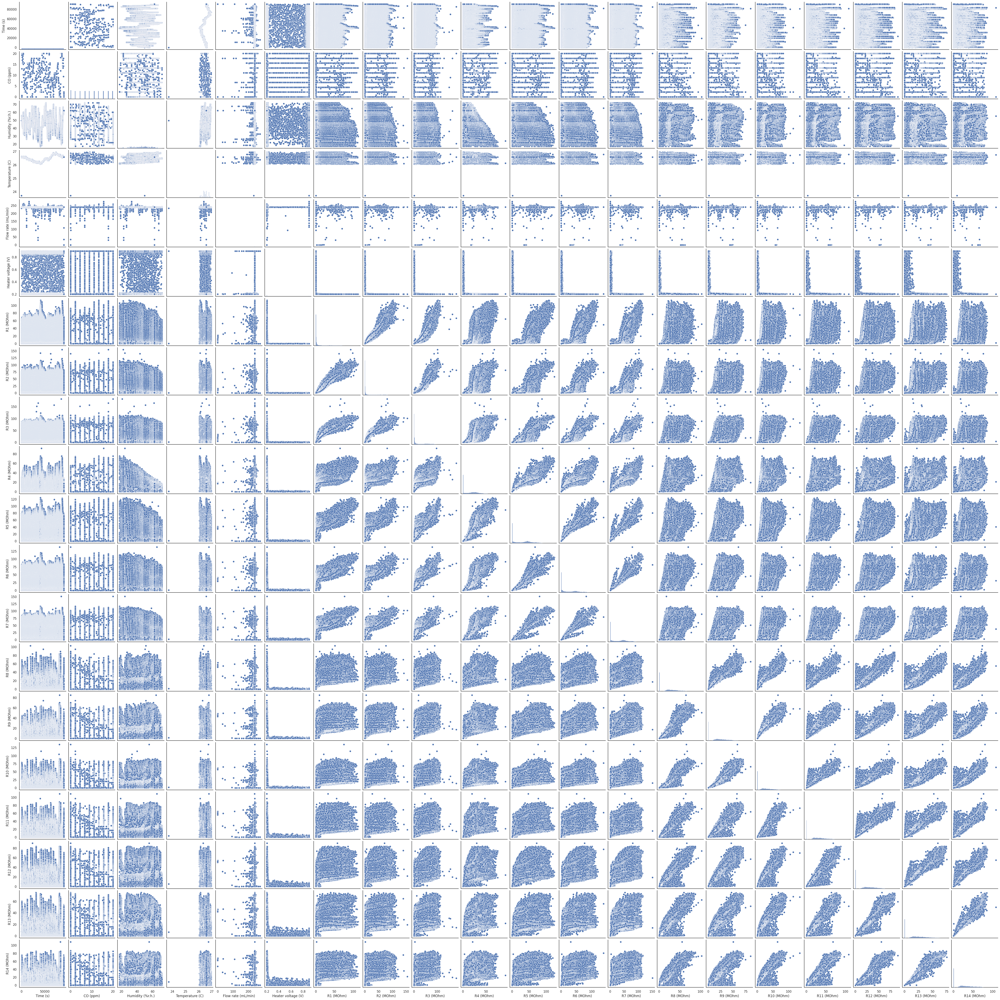

In [ ]:
sns.set(style='white', context='notebook')
g = sns.pairplot(df20160930)
plt.show()

In [ ]:
plt.plot(df["Time (s)"], df["Temperature (C)"])
# Multiple data points at t = 0, consider cutting it.

In [9]:
#import libraries from scikit-learn to split data into train and test sets:
from sklearn.model_selection import train_test_split

In [10]:
#define object and featues in the data frame:
X = df20160930.drop('CO (ppm)',axis=1).drop('Humidity (%r.h.)', axis = 1).values
yCO = df20160930['CO (ppm)'].values
yH = df20160930['Humidity (%r.h.)'].values

In [11]:
#split data into train and test sets:

XCO_train, XCO_test, yCO_train, yCO_test = train_test_split(X, yCO, test_size=0.2, random_state=42)

In [15]:
# Check the type and shape
print(type(XCO_train))
print(XCO_train.shape, XCO_test.shape, yCO_train.shape, yCO_test.shape)

<class 'numpy.ndarray'>
(236575, 18) (59144, 18) (236575,) (59144,)


In [16]:
print(XCO_train)
print(yCO_train)

[[7.8768082e+04 2.6700000e+01 2.4015790e+02 ... 2.9545200e+01
  2.5857200e+01 3.0857900e+01]
 [3.0831741e+04 2.6159100e+01 2.3992530e+02 ... 4.4857500e+01
  5.3141400e+01 7.5547800e+01]
 [7.8608065e+04 2.6740000e+01 2.3966010e+02 ... 3.2987200e+01
  3.0273900e+01 3.6039400e+01]
 ...
 [4.0575456e+04 2.6100000e+01 2.3965720e+02 ... 4.2228300e+01
  3.5952900e+01 4.6775900e+01]
 [4.5157954e+04 2.6220000e+01 2.4004170e+02 ... 1.0720000e-01
  1.0130000e-01 1.0710000e-01]
 [3.7514944e+04 2.6220000e+01 2.4021560e+02 ... 3.0937000e+01
  2.5006500e+01 3.3051200e+01]]
[ 8.89  0.    8.89 ... 13.33 20.   13.33]


In [12]:
from numpy import hstack
from numpy import array
from numpy import concatenate
from numpy import copy

In [13]:
# We need to split the time series into various samples
def sample_split(x_data, y_data, n_steps):
    # Merge everything into a single stack
    X, y = list(), list()
    x_copy = copy(x_data)
    y_shaped = y_data.reshape(-1, 1)
    # print(x_copy)
    # print(y_shaped)
    sequences = concatenate((x_copy, y_shaped), axis = 1)
    # print(sequences)

    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

In [14]:
# Verify Sample Split Worked
X, y = sample_split(XCO_train, yCO_train, 3)
print("Now printing sample split!")
print(X, y)


Now printing sample split!
[[[7.8768082e+04 2.6700000e+01 2.4015790e+02 ... 2.9545200e+01
   2.5857200e+01 3.0857900e+01]
  [3.0831741e+04 2.6159100e+01 2.3992530e+02 ... 4.4857500e+01
   5.3141400e+01 7.5547800e+01]
  [7.8608065e+04 2.6740000e+01 2.3966010e+02 ... 3.2987200e+01
   3.0273900e+01 3.6039400e+01]]

 [[3.0831741e+04 2.6159100e+01 2.3992530e+02 ... 4.4857500e+01
   5.3141400e+01 7.5547800e+01]
  [7.8608065e+04 2.6740000e+01 2.3966010e+02 ... 3.2987200e+01
   3.0273900e+01 3.6039400e+01]
  [2.4935953e+04 2.6220000e+01 2.3994850e+02 ... 2.8252500e+01
   2.4054200e+01 3.1556900e+01]]

 [[7.8608065e+04 2.6740000e+01 2.3966010e+02 ... 3.2987200e+01
   3.0273900e+01 3.6039400e+01]
  [2.4935953e+04 2.6220000e+01 2.3994850e+02 ... 2.8252500e+01
   2.4054200e+01 3.1556900e+01]
  [3.6637081e+04 2.6220000e+01 2.3999150e+02 ... 4.5806500e+01
   4.1356800e+01 5.3842600e+01]]

 ...

 [[3.6874653e+04 2.6220000e+01 2.4004330e+02 ... 3.6187400e+01
   3.1278300e+01 4.0924300e+01]
  [7.968220

In [16]:
n_steps = 3

XCO_train_sample, yCO_train_sample = sample_split(XCO_train, yCO_train, n_steps)
XCO_test_sample, yCO_test_sample = sample_split(XCO_test, yCO_test, n_steps)

In [20]:
# Make the model

print(XCO_train_sample.shape, yCO_train_sample.shape)
n_features = XCO_train_sample.shape[2]
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

# Checking the model summary
model.summary()

(236573, 3, 18) (236573,)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 2, 64)             2368      
                                                                 
 max_pooling1d (MaxPooling1  (None, 1, 64)             0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 64)                0         
                                                                 
 dense (Dense)               (None, 50)                3250      
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 5669 (22.14 KB)
Trainable params: 5669 (22.14 KB)
Non-trainable params: 0 (0.00 By

In [21]:
# Fit the model
history = model.fit(XCO_train_sample, yCO_train_sample, epochs=10,
                    validation_data=(XCO_test_sample, yCO_test_sample))
model.save("my_model.h5", include_optimizer=True)

Epoch 1/10
7393/7393 [==============================] - 21s 3ms/step - loss: 1829.0953 - val_loss: 220.1539
Epoch 2/10
7393/7393 [==============================] - 18s 2ms/step - loss: 459.2529 - val_loss: 44.7693
Epoch 3/10
7393/7393 [==============================] - 23s 3ms/step - loss: 255.9636 - val_loss: 108.0104
Epoch 4/10
7393/7393 [==============================] - 20s 3ms/step - loss: 163.4186 - val_loss: 48.0715
Epoch 5/10
7393/7393 [==============================] - 18s 2ms/step - loss: 103.1963 - val_loss: 166.2138
Epoch 6/10
7393/7393 [==============================] - 21s 3ms/step - loss: 75.3406 - val_loss: 38.0325
Epoch 7/10
7393/7393 [==============================] - 18s 2ms/step - loss: 59.1688 - val_loss: 221.0229
Epoch 8/10
7393/7393 [==============================] - 18s 2ms/step - loss: 47.1013 - val_loss: 34.5114
Epoch 9/10
7393/7393 [==============================] - 22s 3ms/step - loss: 38.6957 - val_loss: 34.4943
Epoch 10/10
7393/7393 [======================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [17]:
model = keras.models.load_model("my_model.h5")
model.compile(optimizer="adam")

In [19]:
predicted_vals = model.predict(XCO_train_sample)
print(predicted_vals)
print(predicted_vals.shape, yCO_train_sample.shape)

7393/7393 [==============================] - 43s 6ms/step
[[ 5.320105]
 [11.647553]
 [ 3.919856]
 ...
 [ 8.041294]
 [ 9.345011]
 [ 9.453154]]
(236573, 1) (236573,)


In [20]:
print(yCO_train_sample)

[ 8.89 13.33  4.44 ... 13.33 20.   13.33]


In [ ]:
residuals = predicted_vals - yCO_train_sample
print(residuals)

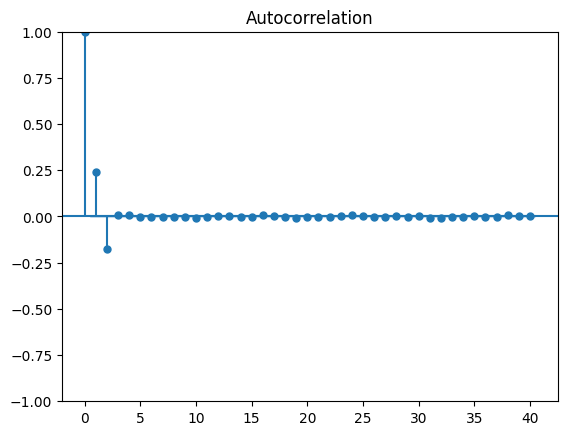

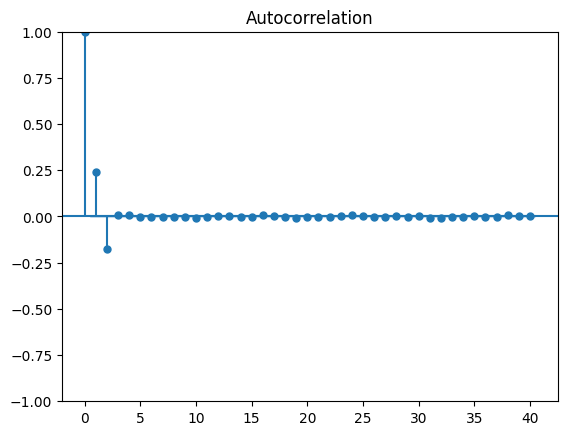

In [26]:
import statsmodels.api as sm
sm.graphics.tsa.plot_acf(predicted_vals.squeeze(), lags=40)

In [ ]:
sm.graphics.tsa.plot_acf((predicted_vals - yCO_test_sample).squeeze(), lags=40)

In [35]:

# See how well we do with prediction
values = model.predict(XCO_test_sample)
print(values)
print(yCO_test_sample)

1849/1849 [==============================] - 5s 2ms/step
[[14.230862 ]
 [ 7.1258287]
 [12.365203 ]
 ...
 [ 9.736025 ]
 [14.902588 ]
 [15.12317  ]]
[15.56  0.   17.78 ... 20.   20.   13.33]


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
print("Confusion Matrix for model")
test_predictions = model3.predict(XCO_test_sample)
test_predictions = np.argmax(test_predictions, axis = 1)
# test_plabels = np.argmax(test_labels, axis = 1)
# Reformat the labels
test_plabels = [res[0] for res in test_labels]
cMat3 = confusion_matrix(test_plabels, test_predictions)
print(cMat3)

In [ ]:
# Make the model
n_steps = 3


n_features = XCO_train_sample.shape[2]
model2 = Sequential()
model2.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
model2.add(MaxPooling1D(pool_size=2))
model2.add(Flatten())
model2.add(Dense(50, activation='relu'))
model2.add(Dense(1))
momodel2del.compile(optimizer='adam', loss='mse')

# Checking the model summary
model.summary()

In [ ]:
def optimize_fnn(hyperparameter):
  # Define model using hyperparameters
  model_comps = []
  dense_count = round(hyperparameter['dense_count'])
  rem1_type = hyperparameter['layer_rem1_type']
  rem2_type = hyperparameter['layer_rem1_type']
  rem3_type = hyperparameter['layer_rem1_type']
  min_nodes = hyperparameter['min_nodes']

  # Do first layer
  max_nodes = 1024
  slope = round((max_nodes - min_nodes) / dense_count)
  curr_node_count = max_nodes
  model_comps.append(Dense(curr_node_count, input_shape=(1024,),activation = rem1_type))
  for i in range(1, dense_count):
    curr_node_count -= slope
    if i % 3 == 0:
      model_comps.append(Dense(curr_node_count, activation = rem1_type))
    elif i % 3 == 2:
      model_comps.append(Dense(curr_node_count, activation = rem2_type))
    else:
      model_comps.append(Dense(curr_node_count, activation = rem3_type))
  model_comps.append(Dropout(hyperparameter['dropout_prob']))
  model_comps.append(Dense(10, activation = 'softsign'))
  fnn_model = Sequential(model_comps)

  fnn_model.compile(optimizer=hyperparameter['optimizer'], loss='categorical_crossentropy', metrics=['accuracy'])

  fnn_model.fit(train_data, to_categorical(train_labels), epochs=2, batch_size=1250//5, verbose=0)
  # Evaluate accuracy on validation data
  performance = fnn_model.evaluate(valid_data, to_categorical(valid_labels), verbose=0)

  print("Hyperparameters: ", hyperparameter, "Accuracy: ", performance[1])
  print("----------------------------------------------------")
  # We want to minimize loss i.e. negative of accuracy
  return({"status": STATUS_OK, "loss": -1*performance[1], "model":fnn_model})

# train_X, train_y = train_fashion_images_3d[:50000], train_fashion_labels[:50000]
# valid_X, valid_y = train_fashion_images_3d[-10000:], train_fashion_labels[-10000:]
train_data, train_labels, valid_data, valid_labels = flatten_train_diff_images, train_diff_labels, flatten_validation_images, validation_labels
# Define search space for hyper-parameters
space = {
    # The number of hidden dense layers:
    'dense_count': hp.uniform('dense_count', 5, 15),
    # The layer types
    'layer_rem1_type': hp.choice('layer_rem1_type', ['relu', 'elu', 'sigmoid', 'tanh', 'selu', 'softplus']),
    'layer_rem2_type': hp.choice('layer_rem2_type',['relu', 'elu', 'sigmoid', 'tanh', 'selu', 'softplus']),
    'layer_rem3_type': hp.choice('layer_rem3_type',['relu', 'elu', 'sigmoid', 'tanh', 'selu', 'softplus']),
    # The minimum number of nodes
    'min_nodes' : hp.uniform('min_nodes', 8, 16),
    # Uniform distribution in finding appropriate dropout values
    'dropout_prob': hp.uniform('dropout_prob', 0.1, 0.35),
    # Choice of optimizer
    'optimizer': hp.choice('optimizer', ['Adam', 'sgd']),
}

trials = Trials()

# Find the best hyperparameters
best = fmin(
        optimize_fnn,
        space,
        algo=tpe.suggest,
        trials=trials,
        max_evals=15,
    )

print("==================================")
print("Best Hyperparameters", best)

test_model = trials.results[np.argmin([r['loss'] for r in trials.results])]['model']

performance = test_model.evaluate(v, to_categorical(test_labels))

print("==================================")
print("Test Accuracy: ", performance[1])